# VFT Assignment 2

# Written by: Surampally Venkatesh (18AE10028)

This Notebook contains source code and plots with derivations included with 'img' files which are properly readable.

This framework is completly written in python script and based on NumPy and Matplotlib libraries extensively.

Note:- This script is also uploaded in github for remote accesing.

# Question 1

1.Create a function, mynumdiff(f,x) to compute the derivative of the function f(x) where x is the grid on which f(x) has been computed. Assume f(x) = sin(x) (Groups I,II),f(x) =cos(x) (Groups III,IV) and f(x) = exp(x) (Groups V,VI,VII). Call mynumdiff(f,x)between the limitsof x as[-2pi, 2pi] having grid points equally spaced at a distance dx.(20 marks)a.Compute the derivative using the forward difference, backward difference and central difference formula and plot the analytical derivative on the same graph.b.Compute the error at each point for different values of dx(varying by atleast 2 orders of magnitude)and plot on a separate log-log graphfor each difference formula.c.Plot  max  error  in  the  entire  domain  as  function  of dxfor  all  thethree  difference formulae on the same graph. What do you observe?

Importing libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

#Numpy is for arrays and matrices
#plt is for plots
#math is for mathematical functions

Part a

Writing a mynumdiff function which returns a list of forward, backward, central differentiation by taking f: function, a: startingpoint, dx as input.

In [2]:
#mynumdiff function
def mynumdiff(f,a,dx):
    h=dx
    #Forward derivative
    forward=(f(a+h)-f(a))/h
    #Backward
    backward=(f(a)-f(a-h))/h
    #central
    central=(forward+backward)/2
    # Loading three differentiations into a list
    derivative=[forward,backward,central]
    #returning the derivative list
    return derivative

In [3]:
#Defining the range of x from -2pi to pi with equally spaced 100 points using linspace attribute for numpy class
x=np.linspace(-2*math.pi,2*math.pi,100)

#Defining the function cos(x)
f=lambda k:(np.math.cos(k))

#Lists of differentiated terms for forward backward and central
forward_list=[]
backward_list=[]
central_list=[]
analytical=[]

#Calculate differential at each in array x and append the differential to their respective lists
for num in x:
    forward_list.append(mynumdiff(f,num,0.1)[0])
    backward_list.append(mynumdiff(f,num,0.1)[1])
    central_list.append(mynumdiff(f,num,0.1)[2])
    analytical.append(-1*math.sin(num))

Text(0.5, 1.0, 'Differential of function with various methods')

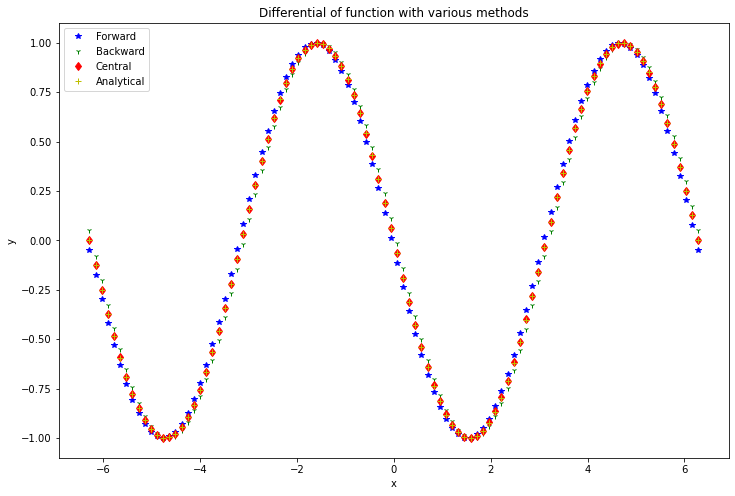

In [4]:
#Plotting the values
plt.figure(figsize=(12,8))
plt.plot(x, forward_list, 'b*',linewidth=0.01)
plt.plot(x, backward_list, 'g1',linewidth=0.01)
plt.plot(x, central_list, 'rd',linewidth=0.01)
plt.plot(x, analytical, 'y+',linewidth=0.01)
plt.legend(['Forward','Backward','Central','Analytical'])
plt.xlabel('x')
plt.ylabel('y')
plt.title('Differential of function with various methods')

Part b

Error plots for forward differentiation

Text(0.5, 1.0, 'Error plot for Forward Differentiation of loglog type.')

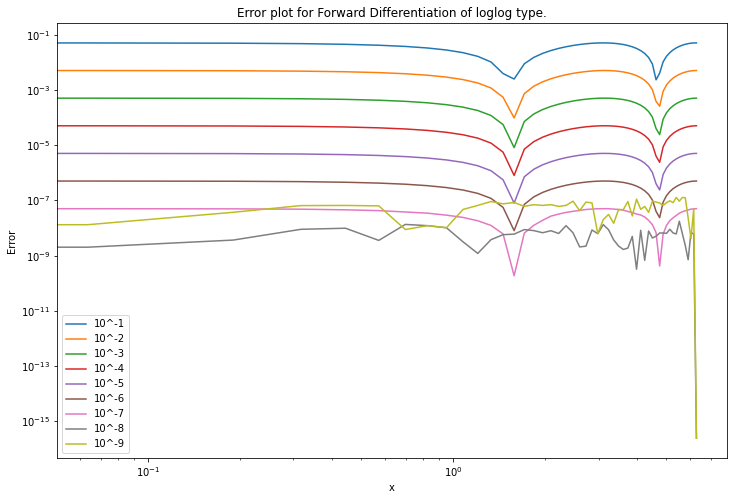

In [5]:
#For different values of dx
plt.figure(figsize=(12,8))
#Arranging the errors for each dx in to a list
error1=[]
for t in range(1,10):
    #Varying dx from 0.1 to 0.1^-9
    dx=0.1**t
    #Putting error into this forward list
    forward_list=[]
    for num in x:
        forward_list.append(abs(-1*math.sin(num)-mynumdiff(f,num,dx)[0]))
    error1.append(forward_list)
    plt.loglog(x,forward_list)
plt.legend(['10^-1','10^-2','10^-3','10^-4','10^-5','10^-6','10^-7','10^-8','10^-9'])
plt.xlabel('x')
plt.ylabel('Error')
plt.title('Error plot for Forward Differentiation of loglog type.')

Observation: As the dx decreases error is getting lower and lower. Oscillation in error is observed from 10^-8.

Error plots for backward differentiation

Text(0.5, 1.0, 'Error plot for Backward Differentiation of loglog type.')

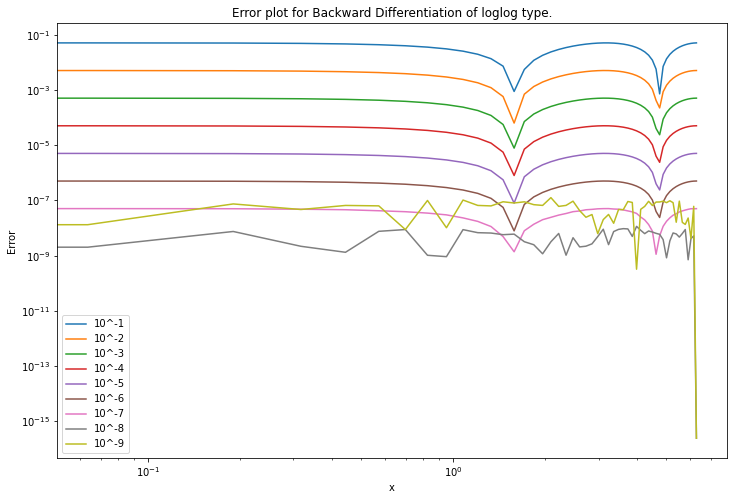

In [6]:
#For different values of dx
plt.figure(figsize=(12,8))
#Arranging the errors for each dx in to a list
error2=[]
for t in range(1,10):
    #Varying dx from 0.1 to 0.1^-9
    dx=0.1**t
    #Putting error into this forward list
    backward_list=[]
    for num in x:
        backward_list.append(abs(-1*math.sin(num)-mynumdiff(f,num,dx)[1]))
    error2.append(backward_list)
    plt.loglog(x,backward_list)
plt.legend(['10^-1','10^-2','10^-3','10^-4','10^-5','10^-6','10^-7','10^-8','10^-9'])
plt.xlabel('x')
plt.ylabel('Error')
plt.title('Error plot for Backward Differentiation of loglog type.')

Observation: As the dx decreases error is getting lower and lower. Oscillation in error is observed from 10^-8.

Error plots for central differentiation

In [7]:
#For different values of dx
#Arranging the errors for each dx in to a list
error3=[]
for t in range(1,10):
    central_list=[]
    #Varying dx from 0.1 to 0.1^-9
    dx=0.1**t
    #Calculating the error at each point and appending into a list
    for num in x:
        central_list.append(abs(-1*math.sin(num)-mynumdiff(f,num,dx)[2]))
    error3.append(central_list[:100])

Text(0.5, 1.0, 'Error plot for Central Differentiation of loglog type.')

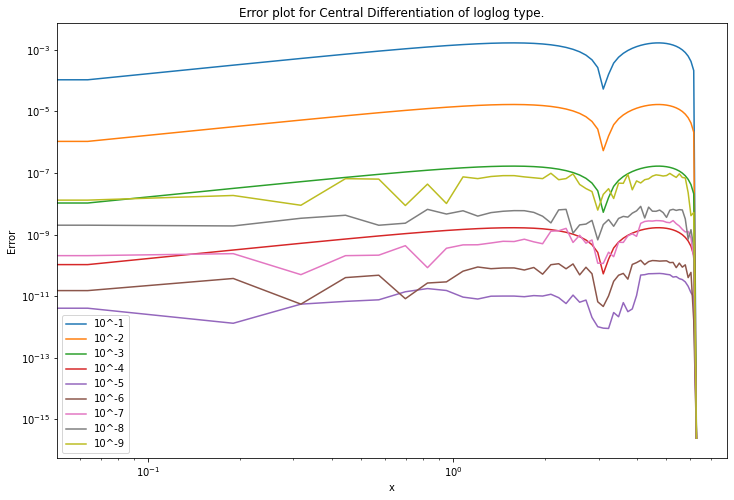

In [8]:
plt.figure(figsize=(12,8))
for t in range(1,10):
    plt.loglog(x,error3[t-1])
plt.legend(['10^-1','10^-2','10^-3','10^-4','10^-5','10^-6','10^-7','10^-8','10^-9'])
plt.xlabel('x')
plt.ylabel('Error')
plt.title('Error plot for Central Differentiation of loglog type.')

Part c

Plot  max  error  in  the  entire  domain  as  function  of dxfor  all  thethree  difference formulae on the same graph.

In [9]:
max_error1=[]
max_error2=[]
max_error3=[]
for i in range(9):
    e1=max(error1[i])
    max_error1.append(e1)
    e2=max(error2[i])
    max_error2.append(e2)
    e3=max(error3[i])
    max_error3.append(e3)

In [10]:
dx=[]
for i in range(1,10):
    dx.append(0.1**i)

Text(0, 0.5, 'Max Error')

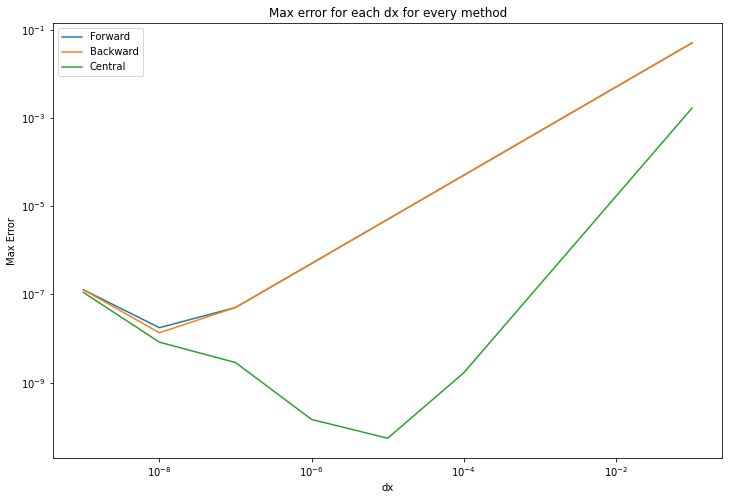

In [11]:
plt.figure(figsize=(12,8))
plt.loglog(dx,max_error1)
plt.loglog(dx,max_error2)
plt.loglog(dx,max_error3)
plt.legend(['Forward','Backward','Central'])
plt.title('Max error for each dx for every method')
plt.xlabel('dx')
plt.ylabel('Max Error')

Observation: Max error is same for Forward and Backward differentiation is same and is linearly increasing with dx. Whereas for central limit max error is least compared to the Forward and backward differentiation and pretty much remains constant with dx.

# Question 2

2.Create  a  function,  mynumintegrate(f,x,a,b)  to  compute  the  integral  of  the  function  f(x) between  the  lower  limit  a  and  upper  limit  b.  Here  x  is  the  grid  on  which  f(x)  has  been computed.  Assume  f(x)  =  sin(x)  (Groups  I,II),  f(x)  =  cos(x)  (Groups  III,IV)  and  f(x)  =  exp(x) (Groups V,VI,VII). Call mynumintegrate(f,x) between the limits  of x as [-2pi, 2pi] having grid points equally spaced at a distance dx.(20 marks)a.Compute  the  integral  using  the  trapezoidal  ruleand  Simpson’s  ruleand  plot  the analytical derivative on the same graph.b.Compute the error at each point for different values of dx and plot it on a separate graph.c.Compute the integral using inbuilt functions trapz and compare it with your integral.Comment on yourobservations.

Writing a mynumintegrate function which returns a list of trapezoidal, simpson, analytical integration by taking f: function, a: startingpoint, b: ending point dx as input.

In [12]:
#mynumintegrate
def mynumintegrate(f,a,b,dx):
    h=dx
    n=int((b-a)/h)
    n=abs(n)
    summ=0
    #Trapezoidal
    for i in range(1,n+1):
        summ+=(f(a+h*(i-1))+f(a+h*i))*h/2
    summs=0
    #Simpson
    for i in range(1,n//2+1):
        summs+=(f(a+(2*i-2)*h)+4*(f(a+(2*i-1)*h))+f(a+2*i*h))*h/3
    # Loading three integrations into a list
    analytical=-math.sin(b)+math.sin(a)
    integrator=[summ,summs,analytical*-1]
    return integrator

In [13]:
#Defining the range
x=np.linspace(-2*math.pi,2*math.pi,50)

#Defining the function
f=lambda k:(np.math.cos(k))
#taking dx=0.1
dx=0.1

#Lists of differentiated terms
trapezoidal_list=[]
simpson_list=[]
analytical=[]
derivative=[]
a=-2*math.pi

#Calculating integral at eachpoint and appending it to their repective lists
for b in x[1:]:
    b=float(b)
    trapezoidal_list.append(mynumintegrate(f,a,b,dx)[0])
    simpson_list.append(mynumintegrate(f,a,b,dx)[1])
    analytical.append(mynumintegrate(f,a,b,dx)[2])

Text(0, 0.5, 'y')

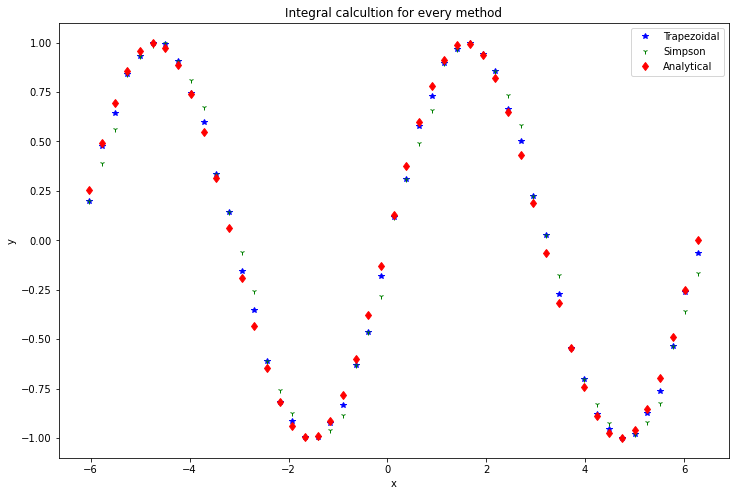

In [14]:
plt.figure(figsize=(12,8))
plt.plot(x[1:], trapezoidal_list, 'b*',linewidth=0.01)
plt.plot(x[1:], simpson_list, 'g1',linewidth=0.01)
plt.plot(x[1:], analytical, 'rd',linewidth=0.01)
plt.legend(['Trapezoidal','Simpson','Analytical'])
plt.title('Integral calcultion for every method')
plt.xlabel('x')
plt.ylabel('y')

b.Compute the error at each point for different values of dx and plot it on a separate graph.

Error for Trapezoidal rule

Text(0.5, 1.0, 'Error vs x for trapezoidal rule')

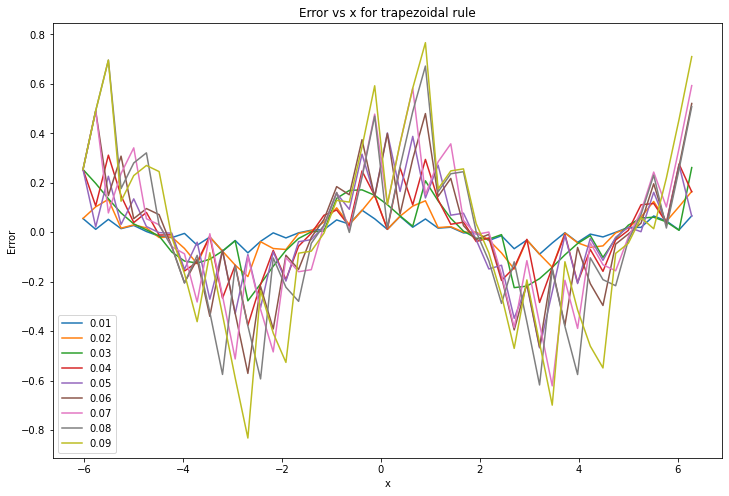

In [15]:
#For different values of dx
#Lists of integrated terms
plt.figure(figsize=(12,8))
errori1=[]
for t in range(1,10):
    dx=0.1*t
    trapezoidal_elist=[]
    a=-2*math.pi
    for b in x[1:]:
        b=float(b)
        trapezoidal_elist.append(math.sin(b)-math.sin(a)-mynumintegrate(f,a,b,dx)[0])
    errori1.append(trapezoidal_elist)
    plt.plot(x[1:],trapezoidal_elist)
plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])
plt.xlabel('x')
plt.ylabel('Error')
plt.title('Error vs x for trapezoidal rule')

Observation: Error is not constantly varying, lot of oscillation is being observed.

Error for simpsons rule

Text(0.5, 1.0, 'Error vs x for simpsons rule')

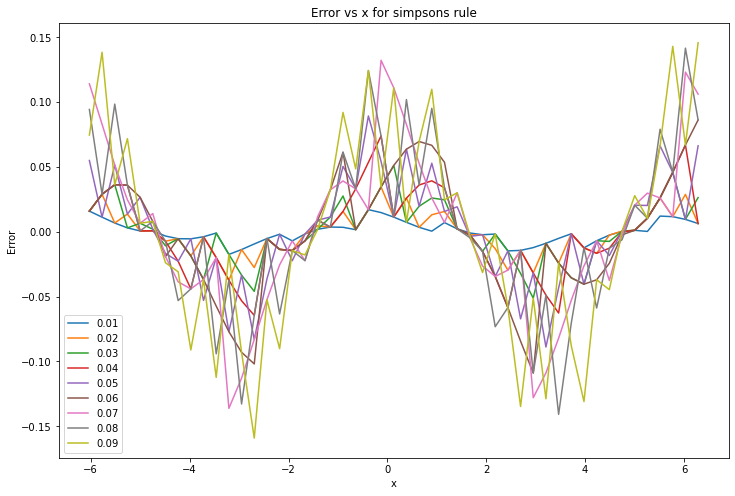

In [16]:
#For different values of dx
#Lists of integrated terms
plt.figure(figsize=(12,8))
errori2=[]
for t in range(1,10):
    dx=0.01*t
    simpson_elist=[]
    a=-2*math.pi
    for b in x[1:]:
        b=float(b)
        simpson_elist.append(math.sin(b)-math.sin(a)-mynumintegrate(f,a,b,dx)[1])
    errori2.append(simpson_elist)
    plt.plot(x[1:],simpson_elist)
plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])
plt.xlabel('x')
plt.ylabel('Error')
plt.title('Error vs x for simpsons rule')

Observation: Error is not constantly varying, lot of oscillation is being observed.

Max error

In [17]:
max_errori1=[]
max_errori2=[]
for i in range(9):
    e1=max(errori1[i])
    max_errori1.append(e1)
    e2=max(errori2[i])
    max_errori2.append(e2)

In [18]:
dx=np.linspace(0.01,0.09,9)

Text(0.5, 1.0, 'Error vs dx for every method')

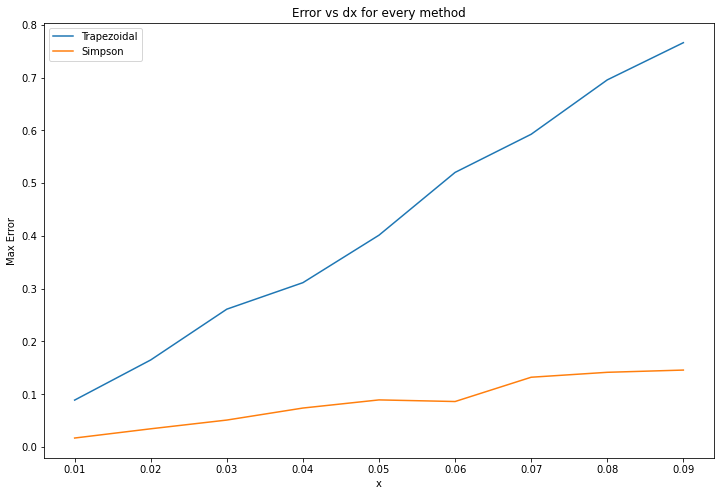

In [19]:
plt.figure(figsize=(12,8))
plt.plot(dx,max_errori1)
plt.plot(dx,max_errori2)
plt.legend(['Trapezoidal','Simpson'])
plt.xlabel('x')
plt.ylabel('Max Error')
plt.title('Error vs dx for every method')

Observation: Trapezoidal error is giving more error than simpson rule and gap between them is increasing with dx.

c.Compute the integral using inbuilt functions trapz and compare it with your integral.Comment on yourobservations.

In [20]:
#Defining the range
x=np.linspace(-2*math.pi,2*math.pi,50)

#Defining the function
f=lambda k:(np.math.cos(k))
dx=0.1
#Lists of integrated terms
trapezoidal_list=[]
inbuilt_trapz=[]
a=-2*math.pi
for i in range(1,len(x)):
    b=x[i]
    b=float(b)
    trapezoidal_list.append(mynumintegrate(f,a,b,dx)[0])
    y=[]
    for num in x[:i]:
        y.append(f(num))
    inbuilt_trapz.append(np.trapz(y, x = None, dx = 4*math.pi/50 , axis = -1))

Comparing our trapezoidal calculation with inbuilt function.

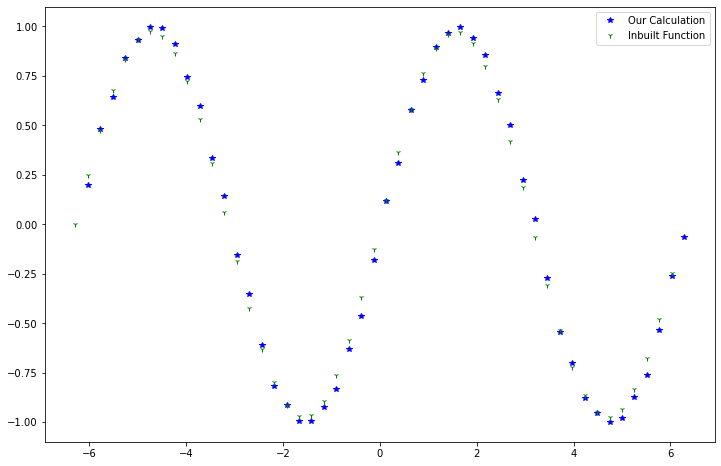

In [21]:
plt.figure(figsize=(12,8))
plt.plot(x[1:], trapezoidal_list, 'b*',linewidth=0.01)
plt.plot(x[:-1], inbuilt_trapz, 'g1',linewidth=0.01)
plt.legend(['Our Calculation','Inbuilt Function'])

Observation: - Both the curves are following similar trend but our own function is having slightly higher and lower values than the inbuilt trapz function.

# Question 3

3.Create a function, mystreamline(u,v,x,y) to compute the streamlines for a given velocity field u(x,y) and v(x,y). Assume the following: (30 marks)Groups I and II Groups III and IV Groups V, VI and VIIu(x,y) = cx/(x2+y2)u(x,y) =  cy/(x2+y2)u(x,y) = cxv(x,y) = cy/(x2+y2)v(x,y) =  -cx/(x2+y2) v(x,y) = -cywhere  c  is  a  constant.Compute  the  streamlines  analytically.  Thereafter compute  the streamlinesnumericallyand compare them with the analytical solutionin a domain [𝑥,𝑦]⊆[[−1,1],[−1,1]].Use the inbuilt matlab function to compare the streamlines.Now,compute the pathlines numericallyusing a similar methodmypathline(u,v,x,y,t) for 20 particles starting 
from random locations on the domainand show that they lie on the streamlines.Identify the stagnation points if any.

    Streamlines, streaklines and pathlines are field lines in a fluid flow. They differ only when the flow changes with time, that is, when the flow is not steady. Considering a velocity vector field in three-dimensional space in the framework of continuum mechanics, we have that:

    Streamlines are a family of curves that are instantaneously tangent to the velocity vector of the flow. These show the direction in which a massless fluid element will travel at any point in time.

    Pathlines are the trajectories that individual fluid particles follow. These can be thought of as "recording" the path of a fluid element in the flow over a certain period. The direction the path takes will be determined by the streamlines of the fluid at each moment in time.

For stream lines : dx/u = dy/v

Numerical Computation

In [22]:
#function for a streamline
def mystreamline(u,v,X,r):
    Y=[]
    y0=-0.05
    x0=-1*r-0.01
    for x in X:
        #Integration using trapezoidal rule
        y=-1*(x0/y0)*x+(x0**2+y0**2)/y0
        #Finding y of point2 from tangent equation at point1
        Y.append(y0)
        x0=x
        y0=y
    Y=np.array(Y)
    return Y

In [23]:
#Defining the function
u=lambda x,y:(c*y/(x**2+y**2))
v=lambda x,y:(-1*c*x/(x**2+y**2))

In [24]:
#Starting point of x are separated by 0.1
c=[]
summ=0
for _ in range(1,11):
    summ+=0.1
    c.append(summ)

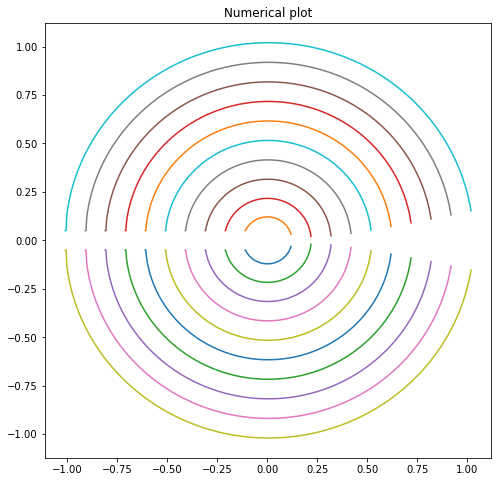

In [25]:
plt.figure(figsize=(8,8))
for r in c:
    X = np.linspace(-1*r-0.01, r+0.018, 500)
    Y=mystreamline(u,v,X,r)
    plt.plot(X,Y)
    plt.plot(X,-1*Y)
    plt.title('Numerical plot')

Note: Numerical function is blowing up near y=0 so we are staying away from that points.

Analyticaly computing the streamlines

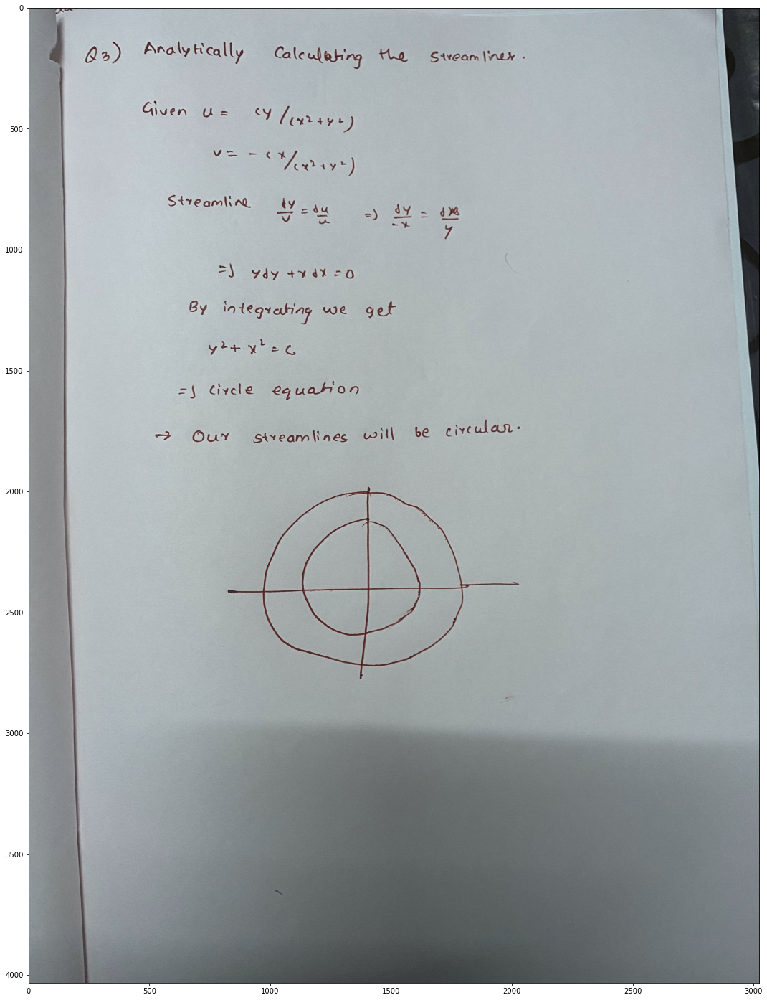

In [26]:
import cv2
img1=cv2.imread('IMG_4825.jpg')
plt.figure(figsize=(25, 25))
plt.imshow(img1)

dx/u = dy/v

By substituting u and v we get dy/dx= -x/y
==> 

In [27]:
#Radius of the circles each one is increasing by 0.1
c=[]
summ=0
for _ in range(1,11):
    summ+=0.1
    c.append(summ)

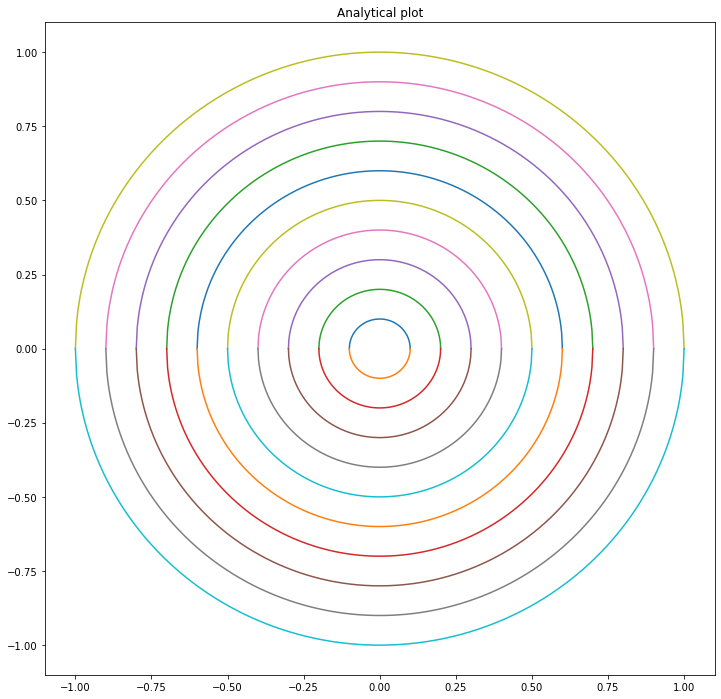

In [28]:
plt.figure(figsize=(12,12))
for r in c:
    X = np.linspace(-1*r, r, 500)
    R=[r]*500
    R=np.array(R)
    Y=((abs(R**2-X**2))**0.5)
    Y1=-1*((abs(R**2-X**2))**0.5)
    plt.plot(X,Y)
    plt.plot(X,Y1)
    plt.title('Analytical plot')

Inbuitlt function for stream lines

In [29]:
import plotly.figure_factory as ff

import numpy as np
c=1
x = np.linspace(-1, 1, 20)
y = np.linspace(-1, 1, 20)
X, Y = np.meshgrid(x, y)
u = c*Y/(X**2+Y**2)
v = -1*c*X/(X**2+Y**2)

# Create streamline figure
fig = ff.create_streamline(x, y, u, v, arrow_scale=.05)
fig.show()

Numerical Calculations for path line

In [30]:
#Defining the function
u=lambda x,y:(c*y/(x**2+y**2))
v=lambda x,y:(-1*c*x/(x**2+y**2))

In [31]:
from random import *

In [32]:
#generating random 20 points
points=[]
for _ in range(20):
    a=random()
    b=random()
    number=[a,b]
    points.append(number)

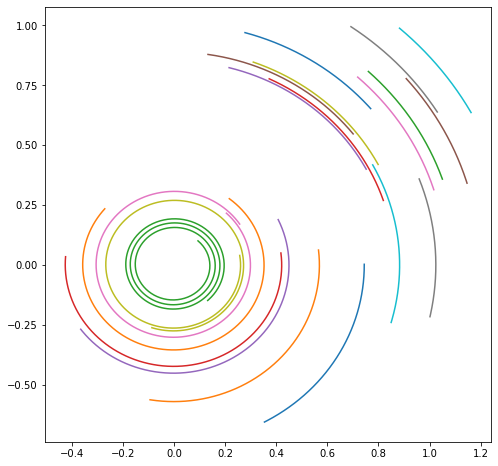

In [33]:
plt.figure(figsize=(8,8))
for point in points:
    x0=point[0]
    y0=point[1]
    X=[]
    Y=[]
    c=1
    dt=0.001
    for _ in range(600):
        #Stepwise integration
        x=x0+u(x0,y0)*dt
        y=y0+v(x0,y0)*dt
        X.append(x0)
        Y.append(y0)
        x0=x
        y0=y
    X=np.array(X)
    Y=np.array(Y)
    plt.plot(X,Y)

Streak lines and pathlines are similar in shape, since this is a steady flow they both will be same.

There will be a stagnation point at the centre (origin (0,0)).

# Question 4

4.Compute numericallyby creating individual functionsand plot the following quantities using, mynumdiff(f,x)a.Divergence b.Gradientc.Curlforavelocity  field, u,governed  by  the  following  expressionin  the  domain[𝑥1,𝑥2,𝑥3]⊆[[−1,1],[−1,1],[−1,1]]at  different𝑥3=𝑐𝑜𝑛𝑠𝑡𝑎𝑛𝑡planesof  your  choice. Derive  the analytical expression for Divergence, Gradient and Curl and plotthe maximum error ineach planefor different values of dxand plot it on a separate graph.(30 marks)[𝑢1𝑢2𝑢3]=[𝑎(𝑥22+𝑥32)+(𝑏+𝑐𝑡)𝑥13𝑥2𝑥3+𝑐𝑒𝑑𝑥1𝑡𝑎(𝑥32+𝑥12)+(𝑏+𝑐𝑡)𝑥23𝑥1𝑥3+𝑐𝑒𝑑𝑥2𝑡𝑎(𝑥12+𝑥22)+(𝑏+𝑐𝑡)𝑥33𝑥1𝑥2+𝑐𝑒𝑑𝑥3𝑡]Assume a is given by the first two digits of your roll number, b is given by the sum of all the digits of your roll number and c is given by the last two digits of your roll number. (For example if your roll number is XYAEP00QR then a is XY, b is X+Y+P+Q+R and c is QRand d is -1).

Derivation of analytical functions

In [34]:
import cv2
import math

In [35]:
img1=cv2.imread('IMG_4768.jpg')
img2=cv2.imread('IMG_4769.jpg')
img3=cv2.imread('IMG_4770.jpg')

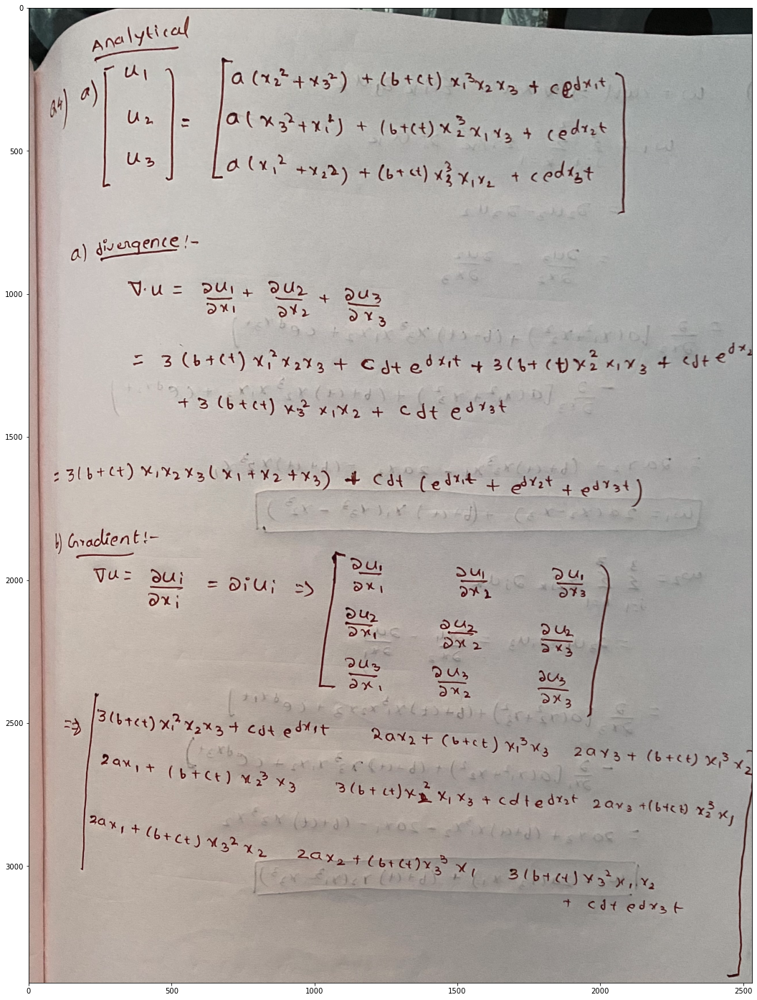

In [36]:
plt.figure(figsize=(25, 25))
plt.imshow(img1)

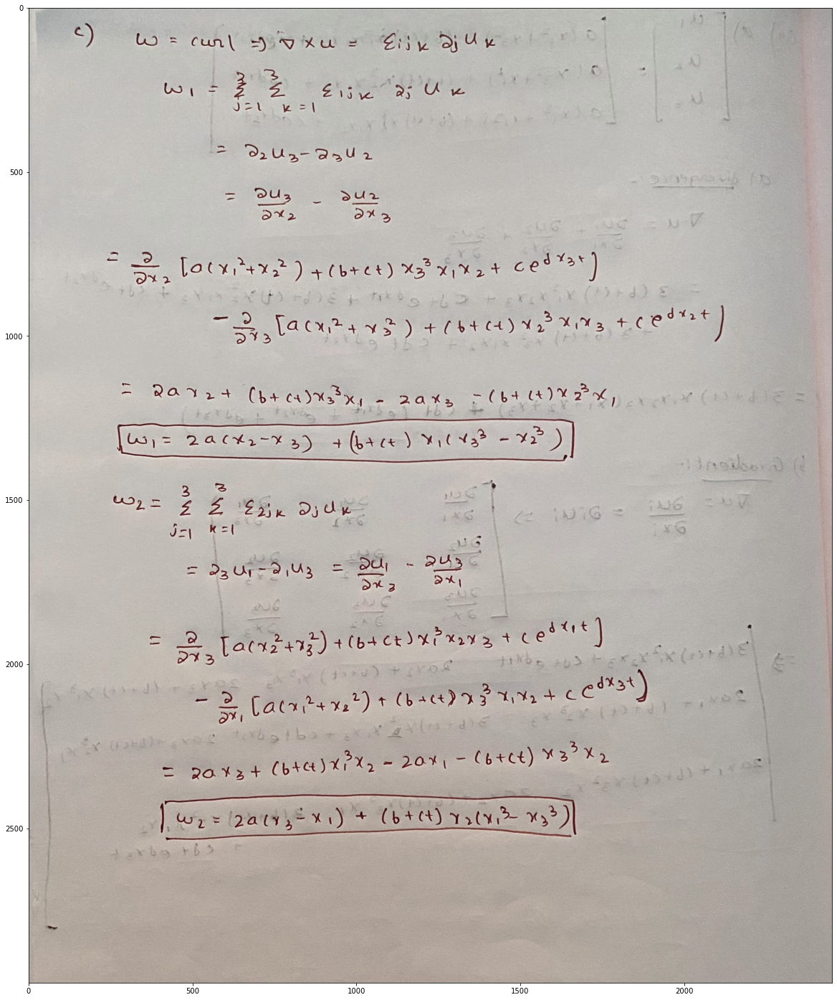

In [37]:
plt.figure(figsize=(25, 25))
plt.imshow(img2)

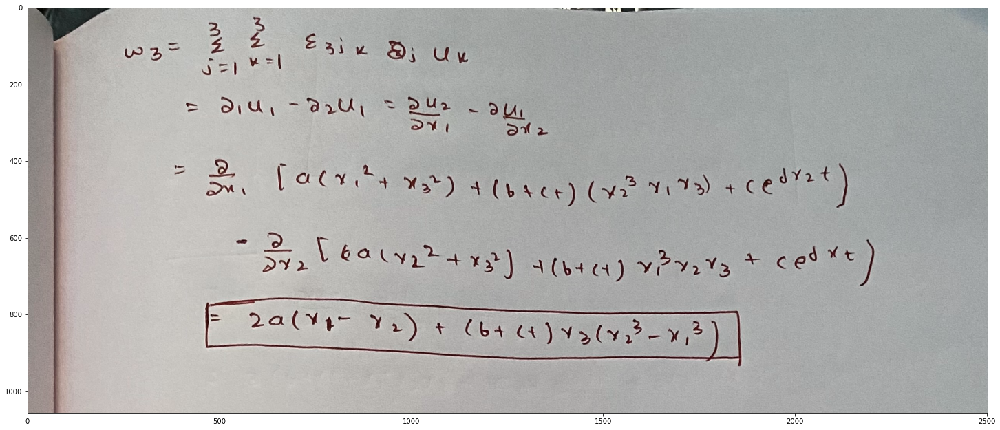

In [38]:
plt.figure(figsize=(25, 25))
plt.imshow(img3)

Determine the values of a, b, c, d, my roll number is 18AE10028

In [39]:
a=18
b=20
c=28
d=-1
t=1

In [40]:
#Divergence analytical function
def divergence(x1,x2,x3):
    a=18
    b=20
    c=28
    d=-1
    t=1
    e=math.e
    value=3*(b+c*t)*x1*x2*x3*(x1+x2+x3)+c*d*t*(e**(d*t*x1)+e**(d*t*x2)+e**(d*t*x3))
    return value

In [41]:
div_matrix=[]
x3=-1.0
while(x3<=1.0):
    x1=-1.0
    out=[]
    list1=[]
    while(x1<=1.0):
        x2=-1.0
        while(x2<=1.0):
            div=divergence(x1,x2,x3)
            list1.append(div)
            x2=x2+0.1
        x1=x1+0.1
    x3+=0.5
    div_matrix.append(list1)

In [42]:
div_matrix=np.array(div_matrix)

In [43]:
#Gradient analytical function
def gradient(x1,x2,x3):
    a=18
    b=20
    c=28
    d=-1
    t=1
    e=math.e
    grad=[3*(b+c*t)*(x1**2)*x2*x3+c*d*t*e**(d*t*x1), 2*a*x2+(b+c*t)*(x1**3)*x3, 2*a*x3+(b+c*t)*(x1**3)*x2, 2*a*x1+(b+c*t)*(x2**3)*x3, 3*(b+c*t)*(x2**2)*x1*x3+c*d*t*e**(d*t*x2),2*a*x3+(b+c*t)*(x2**3)*x1,2*a*x1+(b+c*t)*(x3**3)*x2,2*a*x2+(b+c*t)*(x3**3)*x1,3*(b+c*t)*(x3**2)*x1*x2+c*d*t*e**(d*t*x3)]
    grad=np.array(grad)
    #grad=grad.reshape(3,3)
    return grad

In [44]:
grad_matrix=[]
x3=-1.0
while(x3<=1.0):
    x1=-1.0
    out=[]
    list1=[]
    while(x1<=1.0):
        x2=-1.0
        while(x2<=1.0):
            grad=gradient(x1,x2,x3)
            list1.append(grad)
            x2=x2+0.1
        x1=x1+0.1
    x3+=0.5
    grad_matrix.append(list1)

In [45]:
grad_matrix=np.array(grad_matrix)

In [46]:
#Curl analytical function
def curl(x1,x2,x3):
    a=18
    b=20
    c=28
    d=-1
    t=1
    e=math.e
    value1=2*a*(x2-x3)+(b+c*t)*x1*(x3**3-x2**3)
    value2=2*a*(x3-x1)+(b+c*t)*x2*(x1**3-x3**3)
    value3=2*a*(x1-x2)+(b+c*t)*x3*(x2**3-x1**3)
    curl2=[value1,value2,value3]
    return curl2

In [47]:
curl_matrix=[]
x3=-1.0
while(x3<=1.0):
    x1=-1.0
    out=[]
    list1=[]
    while(x1<=1.0):
        x2=-1.0
        while(x2<=1.0):
            curl1=curl(x1,x2,x3)
            list1.append(curl1)
            x2=x2+0.1
        x1=x1+0.1
    x3+=0.5
    curl_matrix.append(list1)

In [48]:
curl_matrix=np.array(curl_matrix)

Creating functions for u1,u2,u3

In [49]:
def u1(x1,x2,x3):
    value=18*(x2**2+x3**2)+(48)*(x1**3)*(x2)*(x3)+28*(math.e)**(-1*x1)
    return value

In [50]:
def u2(x1,x2,x3):
    value=18*(x3**2+x1**2)+(48)*(x2**3)*(x1)*(x3)+28*(math.e)**(-1*x2)
    return value

In [51]:
def u3(x1,x2,x3):
    value=18*(x2**2+x1**2)+(48)*(x3**3)*(x1)*(x2)+28*(math.e)**(-1*x3)
    return value

Creating a function to calculate differential.

In [52]:
def mynumdiff1(val2,val1,stepsize):
    diff=(val2-val1)/stepsize
    return diff

# Calculating divergence numerically

Text(0.5, 1.0, 'Divergence max error for each plane')

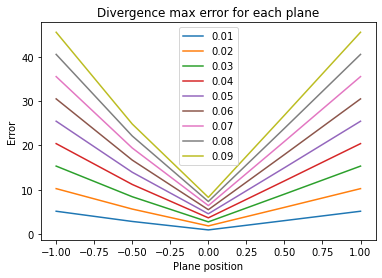

In [53]:
for i in range(1,10):
    h=0.01*i
    num_div_matrix=list()
    x3=-1.0
    while(x3<=1.0):
        x1=-1.0
        out=[]
        list1=[]
        while(x1<=1.0):
            x2=-1.0
            while(x2<=1.0):
                div=mynumdiff1(u1(x1+h,x2,x3),u1(x1,x2,x3),h)+mynumdiff1(u2(x1,x2+h,x3),u2(x1,x2,x3),h)+mynumdiff1(u3(x1,x2,x3+h),u3(x1,x2,x3),h)
                list1.append(div)
                x2=x2+0.1
            x1=x1+0.1
        x3+=0.5
        num_div_matrix.append(list1)
    num_div_matrix=np.array(num_div_matrix)
    error=abs(num_div_matrix-div_matrix)
    plane_error=[max(error[0]),max(error[1]),max(error[2]),max(error[3]),max(error[4])]
    plt.plot([-1,-0.5,0,0.5,1],plane_error)
plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
plt.xlabel('Plane position')
plt.ylabel('Error')
plt.title('Divergence max error for each plane')

# Calculating Grad numerically

<ipython-input-54-d1ce0fe4ed24>:36: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-54-d1ce0fe4ed24>:42: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-54-d1ce0fe4ed24>:48: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can 

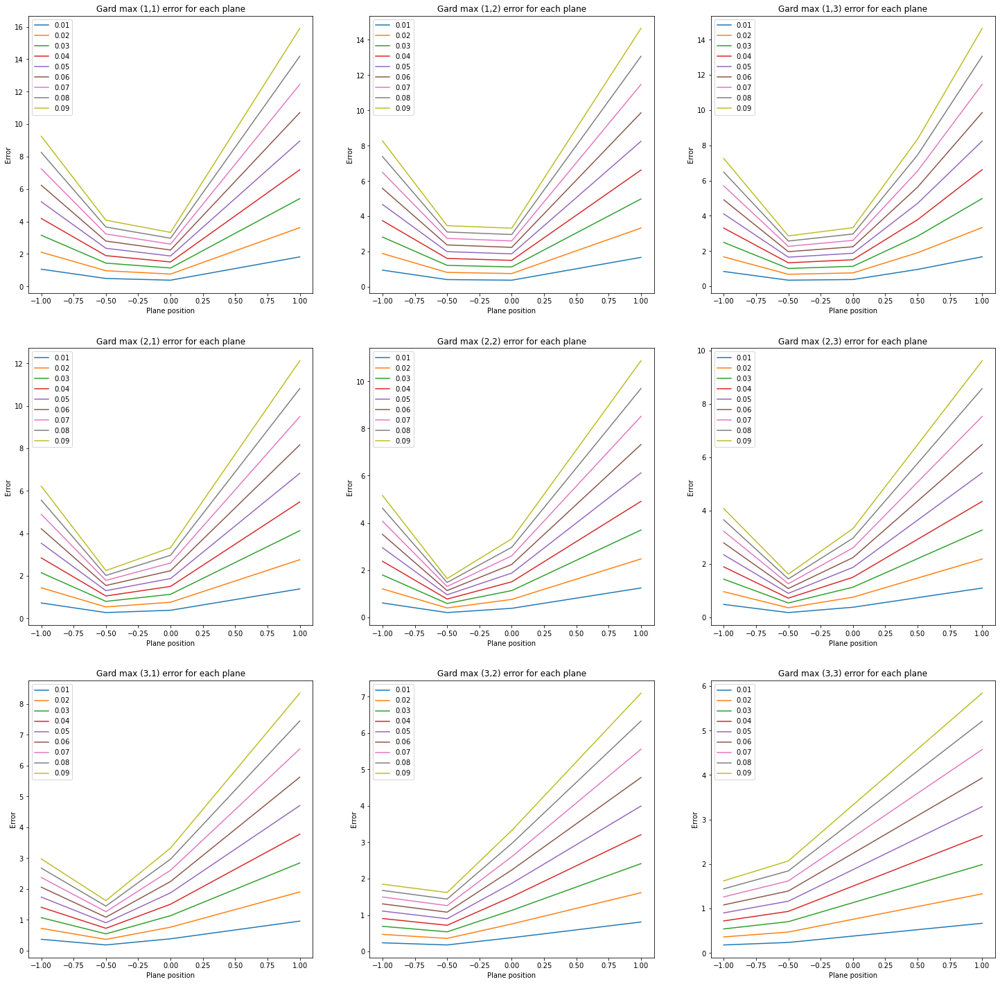

In [54]:
plt.figure(figsize=(25, 25))
for i in range(1,10):
    h=0.01*i
    num_grad_matrix=list()
    x3=-1.0
    while(x3<=1.0):
        x1=-1.0
        out=[]
        list1=[]
        while(x1<=1.0):
            x2=-1.0
            while(x2<=1.0):
                grad=[mynumdiff1(u1(x1+h,x2,x3),u1(x1,x2,x3),h),mynumdiff1(u1(x1,x2+h,x3),u1(x1,x2,x3),h),mynumdiff1(u1(x1,x2,x3+h),u1(x1,x2,x3),h),mynumdiff1(u2(x1+h,x2,x3),u2(x1,x2,x3),h),mynumdiff1(u2(x1,x2+h,x3),u2(x1,x2,x3),h),mynumdiff1(u2(x1,x2,x3+h),u2(x1,x2,x3),h),mynumdiff1(u3(x1+h,x2,x3),u3(x1,x2,x3),h),mynumdiff1(u3(x1,x2+h,x3),u3(x1,x2,x3),h),mynumdiff1(u3(x1,x2,x3+h),u3(x1,x2,x3),h)]
                list1.append(grad)
                x2=x2+0.1
            x1=x1+0.1
        x3+=0.5
        list1=np.array(list1)
        #list1=list1.reshape(3,3)
        num_grad_matrix.append(list1)
    num_grad_matrix=np.array(num_grad_matrix)
    error=abs(num_grad_matrix-grad_matrix)
    
    #Calculating errors for each element in the grad matrix
    plane_error=[max(error[0][:][0]),max(error[1][:][0]),max(error[2][:][0]),max(error[3][:][0]),max(error[4][:][0])]
    plane_error1=[max(error[0][:][1]),max(error[1][:][1]),max(error[2][:][1]),max(error[3][:][1]),max(error[4][:][1])]
    plane_error2=[max(error[0][:][2]),max(error[1][:][2]),max(error[2][:][2]),max(error[3][:][2]),max(error[4][:][1])]
    plane_error3=[max(error[0][:][3]),max(error[1][:][3]),max(error[2][:][3]),max(error[3][:][3]),max(error[4][:][3])]
    plane_error4=[max(error[0][:][4]),max(error[1][:][4]),max(error[2][:][4]),max(error[3][:][4]),max(error[4][:][4])]
    plane_error5=[max(error[0][:][5]),max(error[1][:][5]),max(error[2][:][5]),max(error[3][:][5]),max(error[4][:][5])]
    plane_error6=[max(error[0][:][6]),max(error[1][:][6]),max(error[2][:][6]),max(error[3][:][6]),max(error[4][:][6])]
    plane_error7=[max(error[0][:][7]),max(error[1][:][7]),max(error[2][:][7]),max(error[3][:][7]),max(error[4][:][7])]
    plane_error8=[max(error[0][:][8]),max(error[1][:][8]),max(error[2][:][8]),max(error[3][:][8]),max(error[4][:][8])]
    
    #Plotting errors for each element in the grad matrix
    plt.subplot(3, 3, 1)
    plt.plot([-1,-0.5,0,0.5,1],plane_error)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (1,1) error for each plane')
    plt.subplot(3, 3, 2)
    plt.plot([-1,-0.5,0,0.5,1],plane_error1)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (1,2) error for each plane')
    plt.subplot(3, 3, 3)
    plt.plot([-1,-0.5,0,0.5,1],plane_error2)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (1,3) error for each plane')
    plt.subplot(3, 3, 4)
    plt.plot([-1,-0.5,0,0.5,1],plane_error3)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (2,1) error for each plane')
    plt.subplot(3, 3, 5)
    plt.plot([-1,-0.5,0,0.5,1],plane_error4)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (2,2) error for each plane')
    plt.subplot(3, 3, 6)
    plt.plot([-1,-0.5,0,0.5,1],plane_error5)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (2,3) error for each plane')
    plt.subplot(3, 3, 7)
    plt.plot([-1,-0.5,0,0.5,1],plane_error6)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (3,1) error for each plane')
    plt.subplot(3, 3, 8)
    plt.plot([-1,-0.5,0,0.5,1],plane_error7)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (3,2) error for each plane')
    plt.subplot(3, 3, 9)
    plt.plot([-1,-0.5,0,0.5,1],plane_error8)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Gard max (3,3) error for each plane')

Note: Above plots represent the error for each element at position (i,j) in the gradient matrix for each dx varying from 0.01 to 0.09.

Observation: Error is increasing with dx.

# Calculating Curl numerically

<ipython-input-55-736fcbb271c2>:32: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-55-736fcbb271c2>:38: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-55-736fcbb271c2>:44: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can 

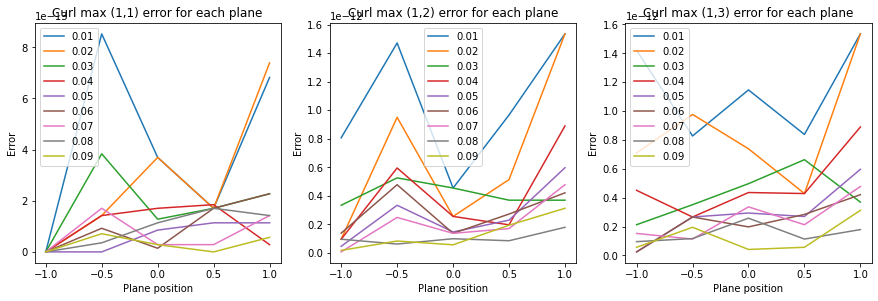

In [55]:
plt.figure(figsize=(15, 15))
for i in range(1,10):
    h=0.01*i
    num_curl_matrix=list()
    x3=-1.0
    while(x3<=1.0):
        x1=-1.0
        out=[]
        list1=[]
        while(x1<=1.0):
            x2=-1.0
            while(x2<=1.0):
                w1=mynumdiff1(u3(x1,x2+h,x3),u3(x1,x2,x3),h)-mynumdiff1(u2(x1,x2,x3+h),u2(x1,x2,x3),h)
                w2=mynumdiff1(u1(x1,x2,x3+h),u1(x1,x2,x3),h)-mynumdiff1(u3(x1+h,x2,x3),u3(x1,x2,x3),h)
                w3=mynumdiff1(u2(x1+h,x2,x3),u2(x1,x2,x3),h)-mynumdiff1(u1(x1,x2+h,x3),u1(x1,x2,x3),h)
                curl=[w1,w2,w3]
                list1.append(curl)
                x2=x2+0.1
            x1=x1+0.1
        x3+=0.5
        list1=np.array(list1)
        num_curl_matrix.append(list1)
    num_curl_matrix=np.array(num_curl_matrix)
    error=abs(num_curl_matrix-curl_matrix)
    
    #Calculating errors for each element in the curl matrix
    plane_error=[max(error[0][:][0]),max(error[1][:][0]),max(error[2][:][0]),max(error[3][:][0]),max(error[4][:][0])]
    plane_error1=[max(error[0][:][1]),max(error[1][:][1]),max(error[2][:][1]),max(error[3][:][1]),max(error[4][:][1])]
    plane_error2=[max(error[0][:][2]),max(error[1][:][2]),max(error[2][:][2]),max(error[3][:][2]),max(error[4][:][1])]
    
    #Plotting errors for each element in the grad matrix
    plt.subplot(3, 3, 1)
    plt.plot([-1,-0.5,0,0.5,1],plane_error)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Curl max (1,1) error for each plane')
    plt.subplot(3, 3, 2)
    plt.plot([-1,-0.5,0,0.5,1],plane_error1)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Curl max (1,2) error for each plane')
    plt.subplot(3, 3, 3)
    plt.plot([-1,-0.5,0,0.5,1],plane_error2)
    plt.legend(['0.01','0.02','0.03','0.04','0.05','0.06','0.07','0.08','0.09'])    
    plt.xlabel('Plane position')
    plt.ylabel('Error')
    plt.title('Curl max (1,3) error for each plane')
 
